In [1]:
%matplotlib inline
from astropy.io import fits
import numpy as np
import copy
import matplotlib.pyplot as plt
import constants as pc

In [2]:
# import a code file hydro3.py
import hydro3

# define a dictionary with some arguments that we will pass to the hydrodynamics code
# the "hnames" and "htype" arguments mean we are using a solution for a massive star from Heger & Woosley
# it has "zero" metallicity, meaning it will be a blue supergiant star

# noplot means we aren't going to draw plots as the code runs, which makes it faster
args = {'hname':'z40.0','htype':'zero','noplot':1,'t_stop':2.5e2}

# define the variable h which is a "lagrange_hydro_1d" object (instance of a class)
h = hydro3.lagrange_hydro_1d(**args)

# this tells the hydro code that we are using a Heger & Woosley star (e.g., so that it knows how to read the file)
h.itype=h.HEGER

In [3]:
# variables stored within our object h are accessed by h.variable_name
# use your past labs and class notebooks, the hydro code notes, and class slides for help!
h.bctype=[h.INFLOW, h.OUTFLOW]
h.setup_initial_conditions()
h.initialize_boundary_conditions()

header:  ['grid', 'cell', 'outer', 'total', 'mass', 'cell', 'outer', 'radius', 'cell', 'outer', 'velocity', 'cell', 'density', 'cell', 'temperature', 'cell', 'pressure', 'cell', 'specific', 'energy', 'cell', 'specific', 'entropy', 'cell', 'angular', 'velocity', 'cell', 'A_bar', 'cell', 'Y_e', 'stability', 'NETWORK', 'neutrons', 'H1', 'He3', 'He4', 'C12', 'N14', 'O16', 'Ne20', 'Mg24', 'Si28', 'S32', 'Ar36', 'Ca40', 'Ti44', 'Cr48', 'Fe52', 'Fe54', 'Ni56', 'Fe56', "'Fe'"]
r inner:  289493848.9016604


gzip: heger_progenitors/zero/z40.0 already exists;	not overwritten
gzip: heger_progenitors/zero/z40.0.gz already exists;	not overwritten


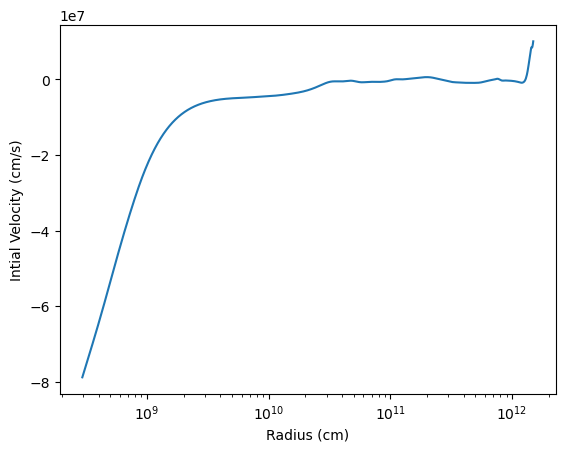

In [4]:
plt.semilogx(h.zones.r, h.zones.v)
plt.xlabel('Radius (cm)')
plt.ylabel('Intial Velocity (cm/s)');

In [5]:
U = 1e53          # create a variable for the initial energy
V = ((4/3) * np.pi * (h.zones.r[5])**3)      # calculate total volume 
u = U/V        # calculate internal energy density

rho = h.zones.d[5]       # calculate density of the first five zones
e = u / rho        # calculate energy per unit mass

h.zones.e[:5] = e   # distribute the initial energy per unit mass to the first 5 zones

In [6]:
h.run()

     0 0.000e+00 6.685e-04
4.289e+33 4.000e+01 5.228e+48 3.101e+52 -1.148e+52 1.953e+52
   100 5.334e-03 3.363e-05
4.289e+33 4.000e+01 4.012e+51 2.993e+52 -1.147e+52 2.246e+52
   200 8.111e-03 2.027e-05
4.289e+33 4.000e+01 7.502e+51 3.271e+52 -1.146e+52 2.875e+52
   300 9.761e-03 1.453e-05
4.289e+33 4.000e+01 8.911e+51 3.467e+52 -1.144e+52 3.214e+52


/home/phdo8065/astr3400/Final Project/hydro3.py:502: RuntimeWarning: divide by zero encountered in divide
  new_d = self.zones.mass/self.zones.vol
/home/phdo8065/astr3400/Final Project/hydro3.py:527: RuntimeWarning: invalid value encountered in multiply
  self.zones.p = (self.gamma - 1)*new_e*new_d


   400 1.121e-02 1.496e-05
4.289e+33 4.000e+01 1.024e+52 3.553e+52 -1.143e+52 3.434e+52
   500 1.284e-02 1.779e-05
4.289e+33 4.000e+01 1.175e+52 3.584e+52 -1.142e+52 3.617e+52
   600 1.482e-02 2.184e-05
4.289e+33 4.000e+01 1.341e+52 3.659e+52 -1.140e+52 3.860e+52
   700 1.718e-02 2.408e-05
4.289e+33 4.000e+01 1.553e+52 3.804e+52 -1.138e+52 4.220e+52
   800 1.941e-02 2.032e-05
4.289e+33 4.000e+01 1.757e+52 3.978e+52 -1.135e+52 4.600e+52
   900 2.133e-02 1.828e-05
4.289e+33 4.000e+01 1.930e+52 4.113e+52 -1.133e+52 4.909e+52
  1000 2.314e-02 1.830e-05
4.289e+33 4.000e+01 2.097e+52 4.199e+52 -1.131e+52 5.164e+52
  1100 2.504e-02 1.977e-05
4.289e+33 4.000e+01 2.268e+52 4.270e+52 -1.129e+52 5.409e+52
  1200 2.710e-02 2.138e-05
4.289e+33 4.000e+01 2.442e+52 4.362e+52 -1.126e+52 5.678e+52
  1300 2.926e-02 2.173e-05
4.289e+33 4.000e+01 2.611e+52 4.484e+52 -1.124e+52 5.972e+52
  1400 3.139e-02 2.084e-05
4.289e+33 4.000e+01 2.775e+52 4.607e+52 -1.121e+52 6.261e+52
  1500 3.345e-02 2.064e-05
4.289

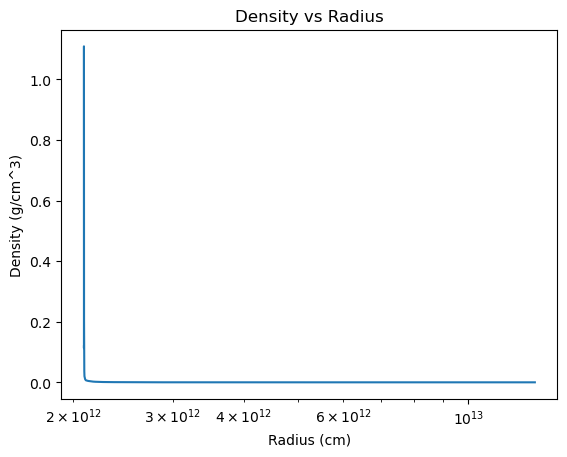

In [7]:
plt.semilogx(h.zones.r, h.zones.d)
plt.title('Density vs Radius')
plt.xlabel('Radius (cm)')
plt.ylabel('Density (g/cm^3)');

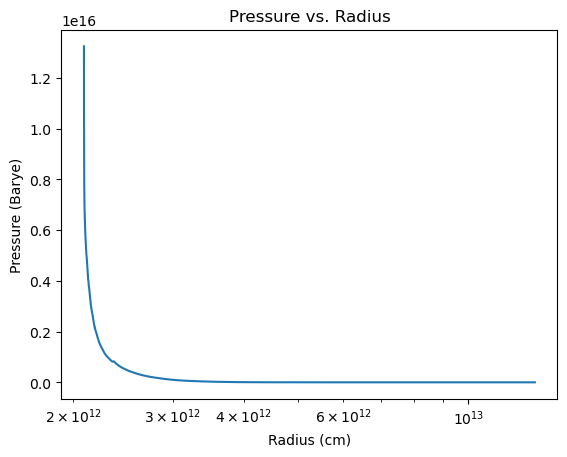

In [8]:
plt.semilogx(h.zones.r, h.zones.p)
plt.title('Pressure vs. Radius')
plt.xlabel('Radius (cm)')
plt.ylabel('Pressure (Barye)');

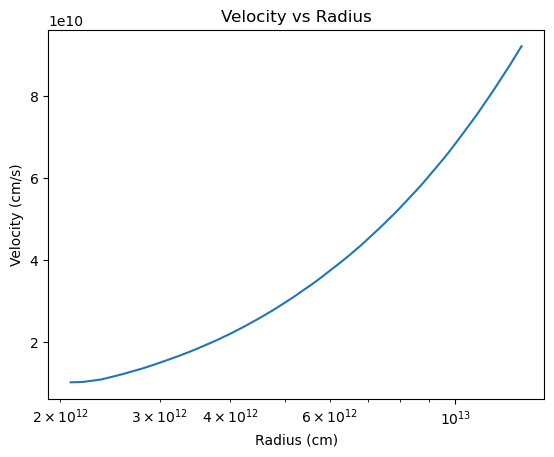

In [9]:
plt.semilogx(h.zones.r, h.zones.v)
plt.title('Velocity vs Radius')
plt.xlabel('Radius (cm)')
plt.ylabel('Velocity (cm/s)');

In [10]:
h.t_stop=h.t*2.
h.run()

4345900 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.232e+49 4.509e+54
4346000 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.232e+49 4.509e+54
4346100 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.232e+49 4.509e+54
4346200 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.232e+49 4.509e+54
4346300 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.231e+49 4.509e+54
4346400 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.231e+49 4.509e+54
4346500 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.231e+49 4.510e+54
4346600 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.231e+49 4.510e+54
4346700 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.231e+49 4.510e+54
4346800 2.500e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.230e+49 4.510e+54
4346900 2.501e+02 4.882e-05
4.289e+33 4.000e+01 4.339e+54 1.708e+53 -9.230e+49 4.510e+54
4347000 2.501e+02 4.8

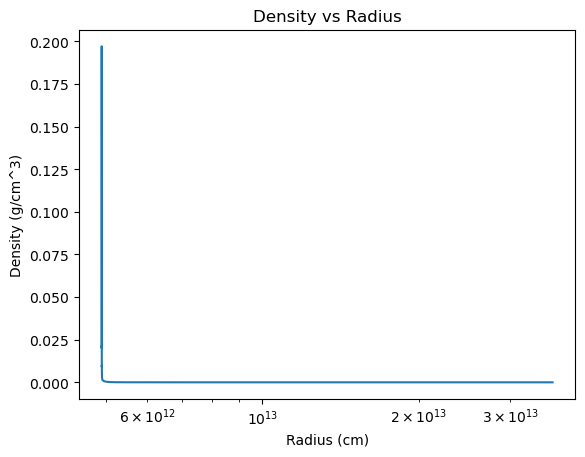

In [11]:
plt.semilogx(h.zones.r, h.zones.d)
plt.title('Density vs Radius')
plt.xlabel('Radius (cm)')
plt.ylabel('Density (g/cm^3)');

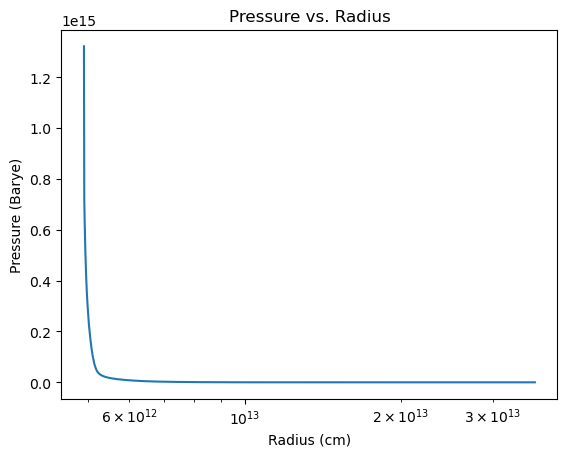

In [12]:
plt.semilogx(h.zones.r, h.zones.p)
plt.title('Pressure vs. Radius')
plt.xlabel('Radius (cm)')
plt.ylabel('Pressure (Barye)');

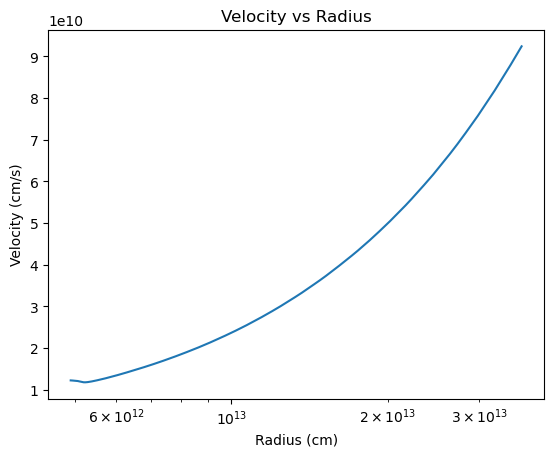

In [13]:
plt.semilogx(h.zones.r, h.zones.v)
plt.title('Velocity vs Radius')
plt.xlabel('Radius (cm)')
plt.ylabel('Velocity (cm/s)');